In [1]:
#!/usr/bin/env python3
# -*- coding: utf-8 -*-

"""
@author: M Arshad Zahangir Chowdhury

Identify experiments, plot roc, pr curve, grad cam maps etc.

"""

%matplotlib inline 

import sys
import os
import matplotlib as mpl
import matplotlib.pyplot as plt
import numpy as np
import pandas as pd
from scipy import signal
from ipywidgets import interactive
import seaborn as sns  #heat map
import glob # batch processing of images

if '../../' not in sys.path:
    sys.path.append('../../')

import math
from scipy import signal
from sklearn.metrics import confusion_matrix
from sklearn.preprocessing import LabelBinarizer
from sklearn.metrics import roc_curve 
from sklearn.metrics import auc
from sklearn.metrics import roc_auc_score

import itertools

from aimos.misc.utils import classifier_internals
from aimos.misc.utils import clf_post_processor


from aimos.spectral_datasets.IR_datasets import IR_data
from aimos.spectral_datasets.IR_datasets import spectra_to_img
from aimos.spectral_datasets.THz_datasets import THz_data

from aimos.misc.aperture import publication_fig
from aimos.misc.voc_net_utils import multiclass_roc_auc_score
from aimos.misc.voc_net_utils import plot_raw_scores
from aimos.misc.voc_net_utils import simple_spectrum_fig
from aimos.misc.voc_net_utils import simple_plot_raw_scores

from aimos.misc.voc_net_utils import plot_sequential_group_prediction



import tensorflow as tf
from tensorflow.keras import datasets, layers, models

GPU_mem_limit=1.0
gpus = tf.config.experimental.list_physical_devices('GPU')
if gpus:
    try:
        tf.config.experimental.set_virtual_device_configuration(gpus[0], [tf.config.experimental.VirtualDeviceConfiguration(memory_limit=GPU_mem_limit*1000.0)])

    except RuntimeError as e:
        print(e)        


# !pip install git+https://github.com/tensorflow/docs

import tensorflow_docs as tfdocs
import tensorflow_docs.modeling
import tensorflow_docs.plots
import tensorflow_docs.modeling
from tensorflow.keras import regularizers

from aimos.models.voc_net_models import get_callbacks
from aimos.models.voc_net_models import get_optimizer
from aimos.models.voc_net_models import compile_and_fit


from aimos.models.voc_net_models import C1f1k3_AP1_D12
from aimos.models.voc_net_models import C1f1k3_MP1_D12

from aimos.models.voc_net_models import C2f1k3_AP1_D12
from aimos.models.voc_net_models import C2f1k3_AP1_D48_D12
from aimos.models.voc_net_models import C2f1k3_AP2_D48_D12

from aimos.models.voc_net_models import C2f3k3_AP1_D48_D12
from aimos.models.voc_net_models import C2f3k3_AP1_D6_D12

from aimos.models.voc_net_models import C1f1k3_AP1_RD50_D12
from aimos.models.voc_net_models import C1f1k3_AP1_D48_RL1_D12
from aimos.models.voc_net_models import C2f3k3_AP1_D48_RD50_D12
from aimos.models.voc_net_models import C2f3k3_AP1_D48_RL1_D12
from aimos.models.voc_net_models import C2f3k3_AP1_D48_RL1_RD50_D12

    

from tensorflow import keras
import keras_tuner as kt


#Set random seed
os.environ['PYTHONHASHSEED'] = str(42)
tf.random.set_seed(42)  
np.random.seed(42)


2022-07-07 12:34:27.896033: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2022-07-07 12:34:28.780207: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcuda.so.1
2022-07-07 12:34:28.809180: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:65:00.0 name: Quadro RTX 4000 computeCapability: 7.5
coreClock: 1.545GHz coreCount: 36 deviceMemorySize: 7.79GiB deviceMemoryBandwidth: 387.49GiB/s
2022-07-07 12:34:28.809233: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2022-07-07 12:34:28.814043: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublas.so.11
2022-07-07 12:34:28.814130: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcublasLt.so

In [2]:
s = THz_data(resolution=0.016, verbosity = False)
s.load_THz_data()
# s.dataset_info()
X = s.spectra
y = s.targets

X=np.expand_dims(X,-1)

In [3]:
#split intro train and test set

#seeds used 123,237, 786
from sklearn.model_selection import train_test_split

TRAIN_SIZE=0.70
TEST_SIZE=1-TRAIN_SIZE

x_train, x_test, y_train, y_test = train_test_split(X, y, train_size=TRAIN_SIZE,
                                                   test_size=TEST_SIZE,
                                                   random_state=786,
                                                   stratify=y
                                                   )

print("All:", np.bincount(y) / float(len(y))*100  )
print("Training:", np.bincount(y_train) / float(len(y_train))*100  )
print("Testing:", np.bincount(y_test) / float(len(y_test))*100  )


All: [8.33333333 8.33333333 8.33333333 8.33333333 8.33333333 8.33333333
 8.33333333 8.33333333 8.33333333 8.33333333 8.33333333 8.33333333]
Training: [8.35148874 8.35148874 8.35148874 8.35148874 8.35148874 8.35148874
 8.35148874 8.2788671  8.35148874 8.35148874 8.2788671  8.2788671 ]
Testing: [8.29103215 8.29103215 8.29103215 8.29103215 8.29103215 8.29103215
 8.29103215 8.46023689 8.29103215 8.29103215 8.46023689 8.46023689]


# build the best model here

In [4]:
def voc_net():

    model = models.Sequential()

    # C1 Convolutional Layer
    model.add(layers.Conv1D(filters = 3 , kernel_size=3, activation='relu', input_shape=(229, 1), name = 'C1') )

    # S2 Subsampling Layer
    model.add(layers.AveragePooling1D(pool_size = 2, strides = 2, padding = 'valid', name = 'S2'))
    
    # C3 Convolutional Layer
    model.add(layers.Conv1D(filters = 3 , kernel_size=3, activation='relu', name = 'C3') )

    # Flatten the CNN output to feed it with fully connected layers
    model.add(layers.Flatten())
    
    model.add(layers.Dense(48, activation='relu')) 
    model.add(layers.Dropout(0.5))
    model.add(layers.Dense(12))  # number of dense layer would be equal to number of classess
    


    model.compile(optimizer=tf.keras.optimizers.Adam(learning_rate=0.01),
            loss=tf.keras.losses.SparseCategoricalCrossentropy(from_logits=True),
                 metrics=[
              tf.keras.losses.SparseCategoricalCrossentropy(
                  from_logits=True, name='SparseCatCrossentropy'),
              'accuracy'])
    
    model.summary()
    
    return model

In [5]:

s.load_experiments()
Xexp = s.exp_spectra
yexp = s.exp_targets
SpectraFrame = pd.DataFrame(s.exp_spectra)
SpectraFrame['labels'] = [s.labels[i] for i in s.exp_targets]
SpectraFrame['targets'] =  s.exp_targets
spectraframe = SpectraFrame 
Xexp = np.expand_dims(Xexp,-1)
print(yexp)

print(s.labels)
print([s.labels[i] for i in s.exp_targets])

Number of Experimental Compounds: 6
Number of Spectrum: 6
Total Number of Spectra: 36
Sample Size of training data: 229
Rows discarded: 22
[10 10 10 10 10 10  2  2  2  2  2  2  1  1  1  1  1  1  0  0  0  0  0  0
  8  8  8  8  8  8 11 11 11 11 11 11]
['CH3Cl', 'CH3OH', 'HCOOH', 'H2CO', 'H2S', 'SO2', 'OCS', 'HCN', 'CH3CN', 'HNO3', 'C2H5OH', 'CH3CHO']
['C2H5OH', 'C2H5OH', 'C2H5OH', 'C2H5OH', 'C2H5OH', 'C2H5OH', 'HCOOH', 'HCOOH', 'HCOOH', 'HCOOH', 'HCOOH', 'HCOOH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CHO', 'CH3CHO', 'CH3CHO', 'CH3CHO', 'CH3CHO', 'CH3CHO']


In [6]:
model = voc_net()

Model: "sequential"
_________________________________________________________________
Layer (type)                 Output Shape              Param #   
C1 (Conv1D)                  (None, 227, 3)            12        
_________________________________________________________________
S2 (AveragePooling1D)        (None, 113, 3)            0         
_________________________________________________________________
C3 (Conv1D)                  (None, 111, 3)            30        
_________________________________________________________________
flatten (Flatten)            (None, 333)               0         
_________________________________________________________________
dense (Dense)                (None, 48)                16032     
_________________________________________________________________
dropout (Dropout)            (None, 48)                0         
_________________________________________________________________
dense_1 (Dense)              (None, 12)                5

2022-07-07 12:34:33.736223: I tensorflow/core/platform/cpu_feature_guard.cc:142] This TensorFlow binary is optimized with oneAPI Deep Neural Network Library (oneDNN) to use the following CPU instructions in performance-critical operations:  AVX2 AVX512F FMA
To enable them in other operations, rebuild TensorFlow with the appropriate compiler flags.
2022-07-07 12:34:33.738035: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1733] Found device 0 with properties: 
pciBusID: 0000:65:00.0 name: Quadro RTX 4000 computeCapability: 7.5
coreClock: 1.545GHz coreCount: 36 deviceMemorySize: 7.79GiB deviceMemoryBandwidth: 387.49GiB/s
2022-07-07 12:34:33.739448: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1871] Adding visible gpu devices: 0
2022-07-07 12:34:33.739560: I tensorflow/stream_executor/platform/default/dso_loader.cc:53] Successfully opened dynamic library libcudart.so.11.0
2022-07-07 12:34:34.154202: I tensorflow/core/common_runtime/gpu/gpu_device.cc:1258] Device interconnect Str

In [45]:
stop_early = tf.keras.callbacks.EarlyStopping(monitor='SparseCatCrossentropy', patience=5)

history = model.fit(x_train, y_train, epochs=200, validation_data=(x_test, y_test), callbacks=[stop_early])

Epoch 1/200
44/44 [==============================] - 0s 7ms/step - loss: 0.0755 - SparseCatCrossentropy: 0.0739 - accuracy: 0.9833 - val_loss: 0.0138 - val_SparseCatCrossentropy: 0.0136 - val_accuracy: 1.0000
Epoch 2/200
44/44 [==============================] - 0s 7ms/step - loss: 0.0668 - SparseCatCrossentropy: 0.0653 - accuracy: 0.9847 - val_loss: 0.0127 - val_SparseCatCrossentropy: 0.0126 - val_accuracy: 1.0000
Epoch 3/200
44/44 [==============================] - 0s 7ms/step - loss: 0.0598 - SparseCatCrossentropy: 0.0613 - accuracy: 0.9797 - val_loss: 0.0117 - val_SparseCatCrossentropy: 0.0116 - val_accuracy: 1.0000
Epoch 4/200
44/44 [==============================] - 0s 7ms/step - loss: 0.0309 - SparseCatCrossentropy: 0.0302 - accuracy: 0.9920 - val_loss: 0.0049 - val_SparseCatCrossentropy: 0.0048 - val_accuracy: 1.0000
Epoch 5/200
44/44 [==============================] - 0s 6ms/step - loss: 0.0359 - SparseCatCrossentropy: 0.0351 - accuracy: 0.9935 - val_loss: 0.0052 - val_SparseCa

In [46]:
model.layers[0].trainable_weights

[<tf.Variable 'C1/kernel:0' shape=(3, 1, 3) dtype=float32, numpy=
 array([[[ 0.86288524,  0.09338371, -0.50651884]],
 
        [[ 0.83697134, -0.9152552 ,  0.9776552 ]],
 
        [[ 1.1923465 ,  1.181809  , -0.7800583 ]]], dtype=float32)>,
 <tf.Variable 'C1/bias:0' shape=(3,) dtype=float32, numpy=array([ 0.01794725,  0.00532628, -0.0094701 ], dtype=float32)>]

In [47]:
from tensorflow.keras import backend as K
# with a Sequential model
get_1st_layer_output = K.function([model.layers[0].input],
                                  [model.layers[1].output])
# layer_output = get_1st_layer_output(x_test)
layer_output = get_1st_layer_output(X)

In [48]:
model.layers[0].get_config()

{'name': 'C1',
 'trainable': True,
 'batch_input_shape': (None, 229, 1),
 'dtype': 'float32',
 'filters': 3,
 'kernel_size': (3,),
 'strides': (1,),
 'padding': 'valid',
 'data_format': 'channels_last',
 'dilation_rate': (1,),
 'groups': 1,
 'activation': 'relu',
 'use_bias': True,
 'kernel_initializer': {'class_name': 'GlorotUniform',
  'config': {'seed': None}},
 'bias_initializer': {'class_name': 'Zeros', 'config': {}},
 'kernel_regularizer': None,
 'bias_regularizer': None,
 'activity_regularizer': None,
 'kernel_constraint': None,
 'bias_constraint': None}

In [49]:
layer_output[0].shape

(1968, 113, 3)

In [50]:
layer_output[0][0].shape

(113, 3)

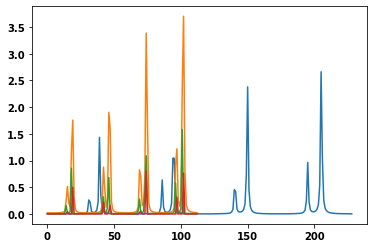

In [51]:
j=0
plt.plot(X[j])
plt.plot(layer_output[0][j])

# training accuracies vs epoch

In [52]:
model.evaluate(x_test,  y_test, verbose=2)

19/19 - 0s - loss: 0.0031 - SparseCatCrossentropy: 0.0031 - accuracy: 1.0000


[0.003142465138807893, 0.003066758392378688, 1.0]

In [53]:
model.evaluate(x_test,  y_test, verbose=2)

19/19 - 0s - loss: 0.0031 - SparseCatCrossentropy: 0.0031 - accuracy: 1.0000


[0.003142465138807893, 0.003066758392378688, 1.0]

In [54]:
probability_model = tf.keras.Sequential([model, 
                                         tf.keras.layers.Softmax()])

In [55]:
predictions = probability_model.predict(x_test)


In [56]:
predictions[5]

array([4.72592560e-13, 6.07455492e-13, 1.00000000e+00, 6.24162333e-10,
       1.07084567e-12, 2.35688857e-10, 3.24735031e-11, 1.18515288e-16,
       3.49616813e-14, 3.32268054e-14, 2.41992646e-12, 1.04183875e-11],
      dtype=float32)

9


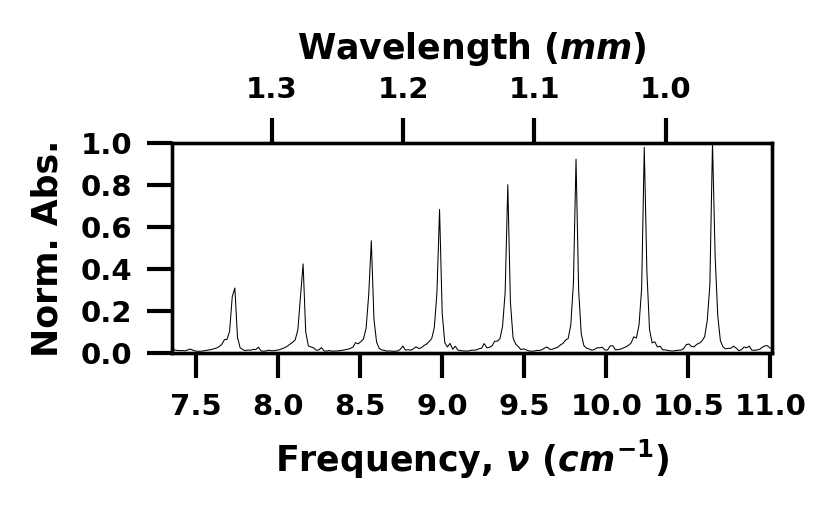

In [57]:

# high quality
i=4;

fig_score, ax_score = plot_raw_scores(i, predictions, y_test, s.labels)
fig_spectra, ax_spectra  = publication_fig(s.frequencies, 
                   x_test[i], 
                   xlim_low=s.frequencies[0],
                   xlim_high=s.frequencies[-1]+0.01, 
                   ylim_low=0,
                   ylim_high=1.00,
                   fig_prop = {'figsize':(2,0.7), 'dpi':300, 'ax_rect': [0,0,1,1]},
                   plot_prop = {'linewidth':0.25, 'color':'black' , 'fontweight':'bold', 'label' : 'compound'},
                   legend_prop = {'loc':2, 'size':3},
                   major_tick_params =  {'which':'major', 'size':6, 'width':1, 'direction':'out','labelsize':7},
                   minor_tick_params =  {'which':'minor', 'size':2, 'width':1, 'direction':'out','labelsize':7},
                   tick_locator = {'xmajor':0.5, 'xminor':1.5, 'ymajor':0.2, 'yminor':0.4},
                   xlabelinfo = {'xlabel': r'Frequency, $\nu$ ($cm^{-1}$)', 'labelpad':4, 'fontsize':'small', 'fontweight':'bold'}, 
                   ylabelinfo = {'ylabel': r'Norm. Abs.', 'labelpad':4, 'fontsize':'small', 'fontweight':'bold'},
                   twin_xlabelinfo = {'xlabel': 'Wavelength ($mm$)', 'labelpad':4, 'fontsize':'small', 'fontweight':'bold'}, 
                   plot_flags = {'twinx': True, 'legend':False}
                   );


print(y_test[i])

fig_score
fig_spectra

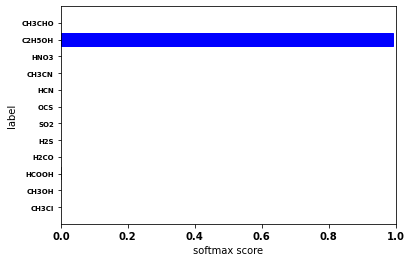

In [58]:


i=3
# simple_spectrum_fig(s.frequencies, x_test[i])
simple_plot_raw_scores(i, predictions, y_test,s.labels)

In [59]:
x_test.shape

(591, 229, 1)

In [60]:
np.squeeze(x_test).shape

(591, 229)

In [61]:
y_test.shape

(591,)

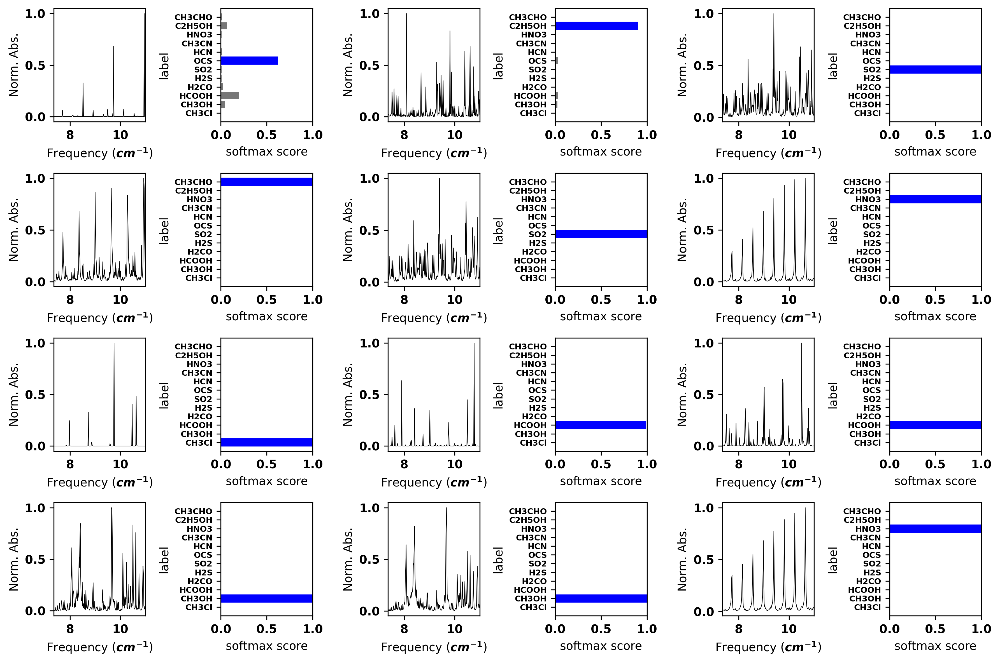

In [62]:
fig = plot_sequential_group_prediction(np.squeeze(x_test), y_test, predictions, s.frequencies,s.labels, 519, dpi = 300)

fig.savefig(r'RESULTS/results_figures/softmax_figures_test_spectra_start_idx_519.png', bbox_inches='tight')

In [63]:
pred_y=np.argmax(model.predict(x_test), axis=-1)

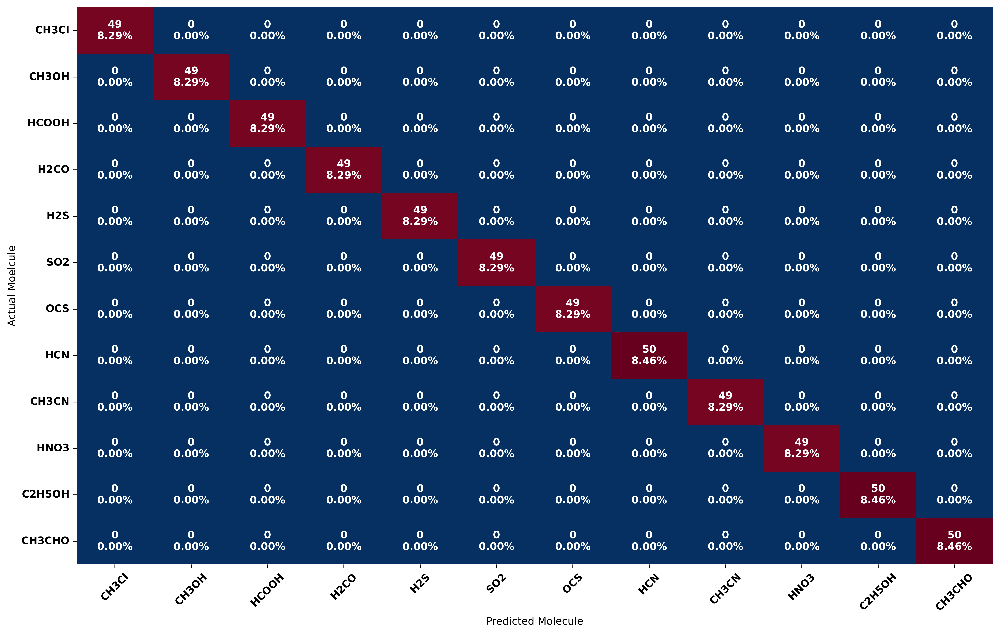

In [64]:
cm = confusion_matrix(y_test, pred_y)

group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]

annot_labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_counts,group_percentages)]

fig = plt.figure(figsize=(16,10), dpi = 600);
# plt.title('Confusion matrix);

# ax = sns.heatmap(cm, annot=True, cmap='PiYG');   #cmap='coolwarm' also good
ax = sns.heatmap(cm/np.sum(cm), annot=np.asarray(annot_labels).reshape(12,12), fmt = '', cmap='RdBu_r',cbar=False);   #cmap='coolwarm' also good
#ax = sns.heatmap(cm/np.sum(cm), annot=True, fmt='.2%', cmap='Blues') #Shows percentage
ax.set_xticklabels(s.labels);
ax.set_yticklabels(s.labels);
plt.xlabel('Predicted Molecule');
plt.ylabel('Actual Moelcule');
plt.xticks(rotation=45);
plt.yticks(rotation=0);
plt.savefig(r'RESULTS/results_figures/cm_test_data.png', bbox_inches='tight')

In [65]:
classifier_internals(pred_y, y_test, y_train, 'simple_CNN')

---------------------------- simple_CNN -------------------------------
Fraction Correct[Accuracy]:
1.0
Samples Correctly Classified:
(array([  0,   1,   2,   3,   4,   5,   6,   7,   8,   9,  10,  11,  12,
        13,  14,  15,  16,  17,  18,  19,  20,  21,  22,  23,  24,  25,
        26,  27,  28,  29,  30,  31,  32,  33,  34,  35,  36,  37,  38,
        39,  40,  41,  42,  43,  44,  45,  46,  47,  48,  49,  50,  51,
        52,  53,  54,  55,  56,  57,  58,  59,  60,  61,  62,  63,  64,
        65,  66,  67,  68,  69,  70,  71,  72,  73,  74,  75,  76,  77,
        78,  79,  80,  81,  82,  83,  84,  85,  86,  87,  88,  89,  90,
        91,  92,  93,  94,  95,  96,  97,  98,  99, 100, 101, 102, 103,
       104, 105, 106, 107, 108, 109, 110, 111, 112, 113, 114, 115, 116,
       117, 118, 119, 120, 121, 122, 123, 124, 125, 126, 127, 128, 129,
       130, 131, 132, 133, 134, 135, 136, 137, 138, 139, 140, 141, 142,
       143, 144, 145, 146, 147, 148, 149, 150, 151, 152, 153, 154, 155,
 

ROC AUC score: 1.0


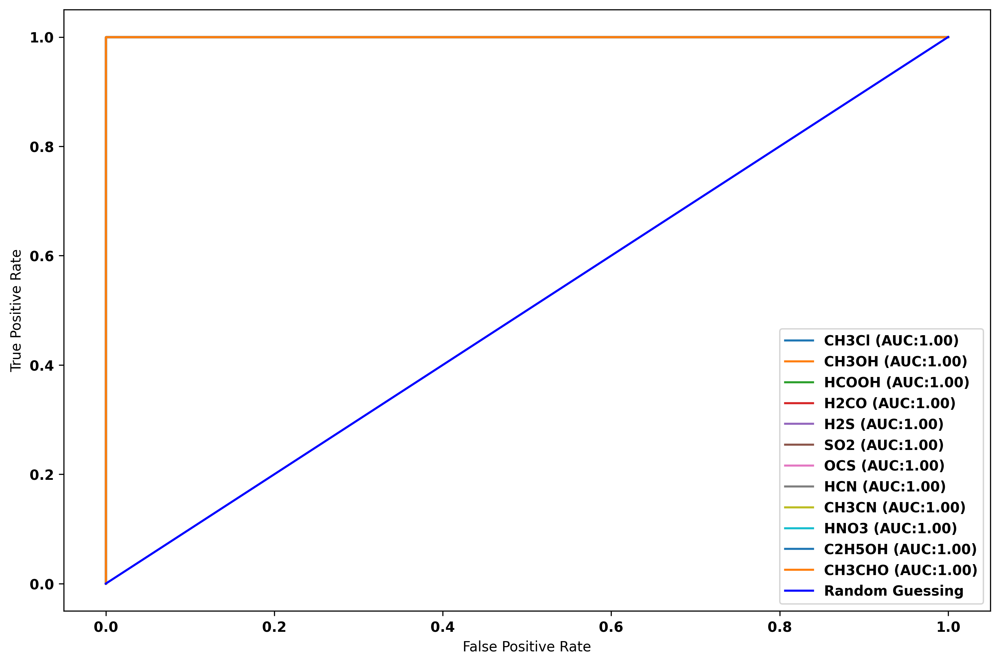

In [66]:

print('ROC AUC score:', multiclass_roc_auc_score(y_test, pred_y, s.labels)[0])

fig = multiclass_roc_auc_score(y_test, pred_y, s.labels)[1]
fig.savefig(r'RESULTS/results_figures/ROC_test_data.png', bbox_inches='tight')
fig

In [67]:
pred_y_train=np.argmax(model.predict(x_train), axis=-1)

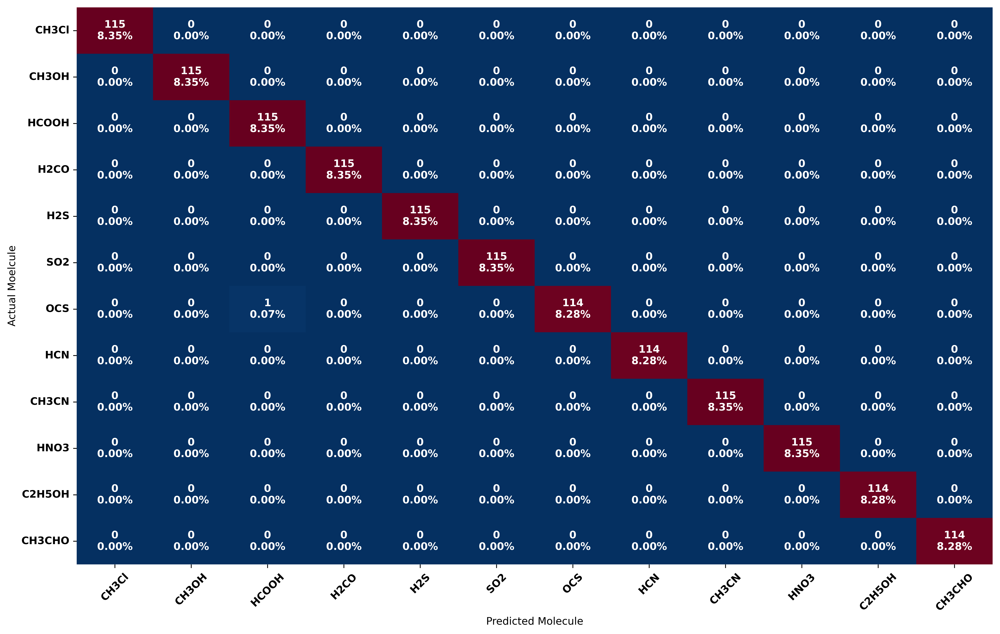

In [68]:
cm = confusion_matrix(y_train, pred_y_train)

group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]

annot_labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_counts,group_percentages)]

fig = plt.figure(figsize=(16,10), dpi = 600);
# plt.title('Confusion matrix);

# ax = sns.heatmap(cm, annot=True, cmap='PiYG');   #cmap='coolwarm' also good
ax = sns.heatmap(cm/np.sum(cm), annot=np.asarray(annot_labels).reshape(12,12), fmt = '', cmap='RdBu_r',cbar=False);   #cmap='coolwarm' also good
#ax = sns.heatmap(cm/np.sum(cm), annot=True, fmt='.2%', cmap='Blues') #Shows percentage
ax.set_xticklabels(s.labels);
ax.set_yticklabels(s.labels);
plt.xlabel('Predicted Molecule');
plt.ylabel('Actual Moelcule');
plt.xticks(rotation=45);
plt.yticks(rotation=0);
plt.savefig(r'RESULTS/results_figures/cm_train_data.png', bbox_inches='tight')

In [69]:
classifier_internals(pred_y_train, y_train, y_train, 'simple_CNN')

---------------------------- simple_CNN -------------------------------
Fraction Correct[Accuracy]:
0.9992737835875091
Samples Correctly Classified:
(array([   0,    1,    2, ..., 1374, 1375, 1376]),)
Samples Incorrectly Classified:
(array([1112]),)
All Train y with label identifier [ 6  3  0 ...  8  0 10] 

Data misidentified:

Test y with incorrect indexes label identifier [6] 

Predicted y with incorrect indexes label identifier [2] 

Correct data identified:

Test y with correct indexes label identifier [ 6  3  0 ...  8  0 10] 

Predicted y correct indexes label identifier [ 6  3  0 ...  8  0 10] 

All Test y with label identifier [ 6  3  0 ...  8  0 10] 

All Pred y with label identifier [ 6  3  0 ...  8  0 10] 



ROC AUC score: 0.9996046647832978


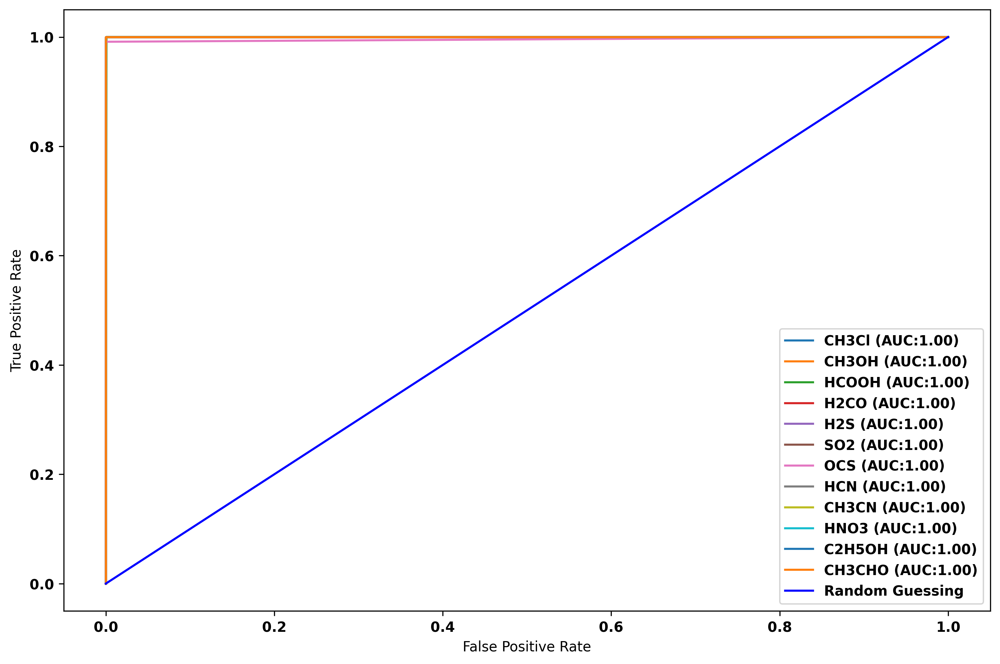

In [90]:

print('ROC AUC score:', multiclass_roc_auc_score(y_train, pred_y_train, s.labels)[0])

fig = multiclass_roc_auc_score(y_train, pred_y_train, s.labels)[1]
fig.savefig(r'RESULTS/results_figures/ROC_train_data.png', bbox_inches='tight')
fig

In [70]:
predictions_on_train = probability_model.predict(x_train)

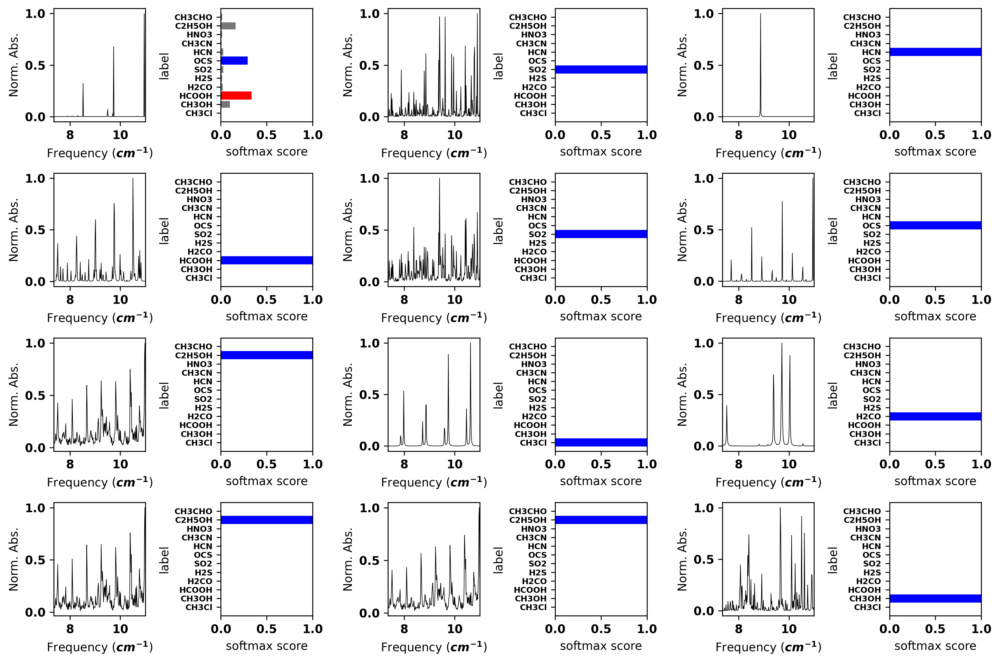

In [71]:
fig = plot_sequential_group_prediction(np.squeeze(x_train), y_train, predictions_on_train, s.frequencies,s.labels, 1112, dpi = 300)

fig.savefig(r'RESULTS/results_figures/softmax_figures_train_spectra_start_idx_1112.png', bbox_inches='tight')

In [72]:
pred_y_exp=np.argmax(model.predict(Xexp), axis=-1)
print(pred_y_exp)

[10 10 10 10 10 10  2  2  2  2  2  2  1  1  1  1  1  1  0  0  0  0  0  0
  8  8  8  8  8  8 11 11 11 11 11 11]


In [73]:
predictions_exp = probability_model.predict(Xexp) # softmax scores for experiment


In [74]:
yexp

array([10, 10, 10, 10, 10, 10,  2,  2,  2,  2,  2,  2,  1,  1,  1,  1,  1,
        1,  0,  0,  0,  0,  0,  0,  8,  8,  8,  8,  8,  8, 11, 11, 11, 11,
       11, 11])

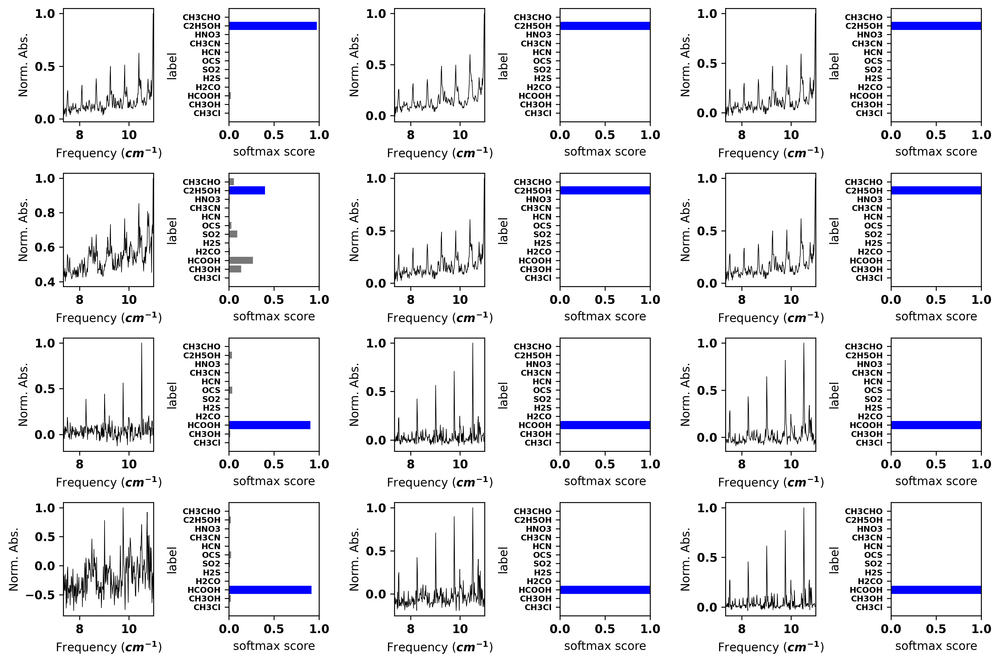

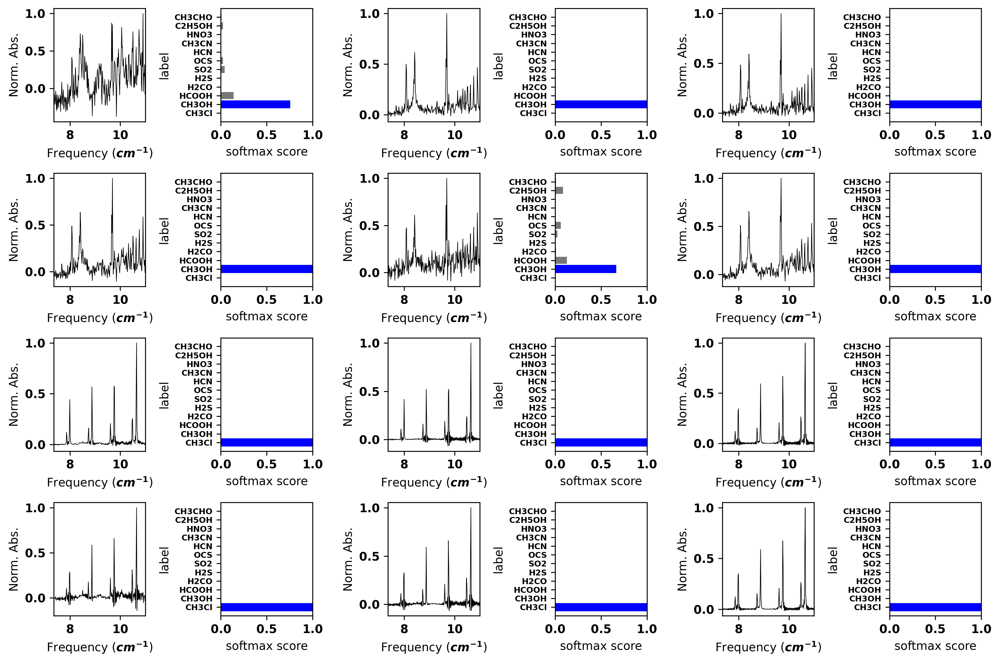

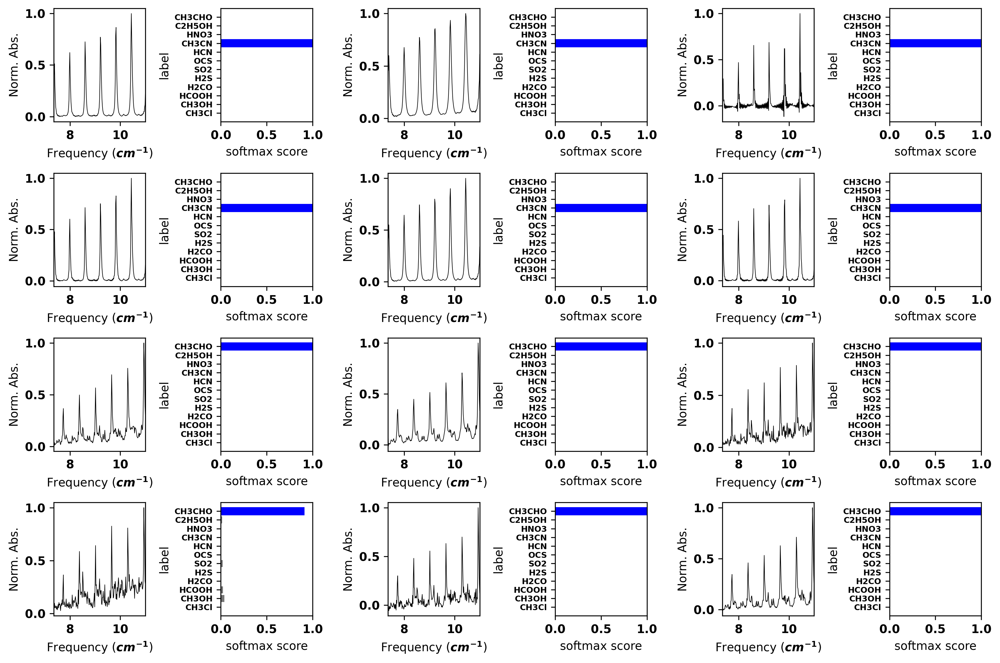

In [75]:
fig = plot_sequential_group_prediction(Xexp, yexp, predictions_exp, s.frequencies, 
                                 s.labels, 0)

fig.savefig(r'RESULTS/results_figures/softmax_figures_exp_spectra_start_idx_0_to_11.png', bbox_inches='tight')

fig = plot_sequential_group_prediction(Xexp, yexp, predictions_exp, s.frequencies, 
                                 s.labels, 12)

fig.savefig(r'RESULTS/results_figures/softmax_figures_exp_spectra_start_idx_12_to_23.png', bbox_inches='tight')

fig = plot_sequential_group_prediction(Xexp, yexp, predictions_exp, s.frequencies, 
                                 s.labels, 24)

fig.savefig(r'RESULTS/results_figures/softmax_figures_exp_spectra_start_idx_24_to_36.png', bbox_inches='tight')

In [76]:
print([s.labels[i] for i in s.exp_targets])

['C2H5OH', 'C2H5OH', 'C2H5OH', 'C2H5OH', 'C2H5OH', 'C2H5OH', 'HCOOH', 'HCOOH', 'HCOOH', 'HCOOH', 'HCOOH', 'HCOOH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3OH', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3Cl', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CN', 'CH3CHO', 'CH3CHO', 'CH3CHO', 'CH3CHO', 'CH3CHO', 'CH3CHO']


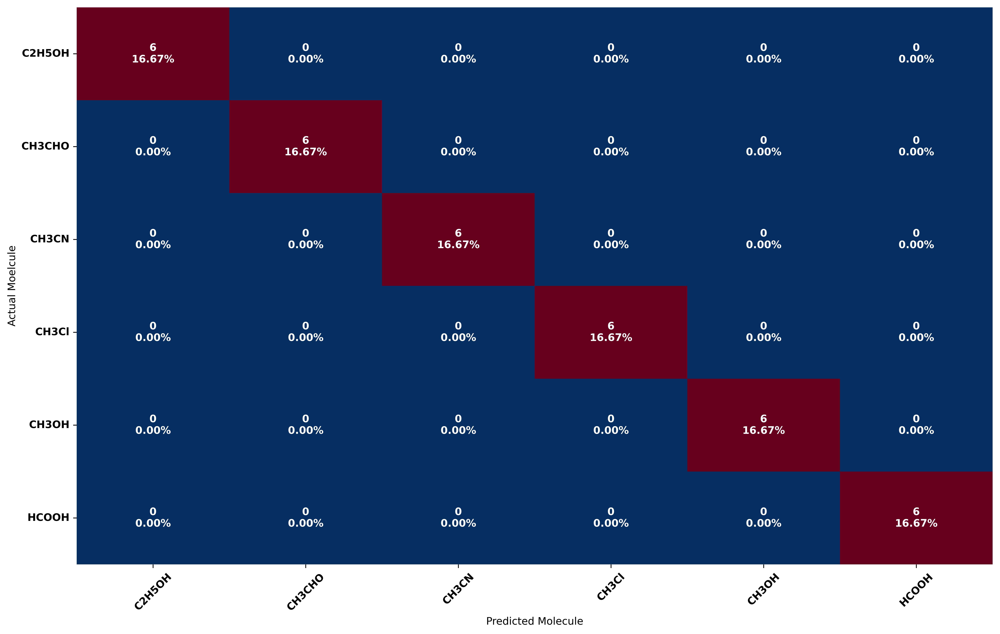

In [77]:
cm = confusion_matrix(yexp, pred_y_exp)

group_counts = ["{0:0.0f}".format(value) for value in
                cm.flatten()]

group_percentages = ["{0:.2%}".format(value) for value in
                     cm.flatten()/np.sum(cm)]

annot_labels = [f"{v1}\n{v2}" for v1, v2 in
          zip(group_counts,group_percentages)]

fig = plt.figure(figsize=(16,10), dpi = 600);
# plt.title('Confusion matrix);

# ax = sns.heatmap(cm, annot=True, cmap='PiYG');   #cmap='coolwarm' also good
ax = sns.heatmap(cm/np.sum(cm), annot=np.asarray(annot_labels).reshape(6,6), fmt = '', cmap='RdBu_r',cbar=False);   #cmap='coolwarm' also good
#ax = sns.heatmap(cm/np.sum(cm), annot=True, fmt='.2%', cmap='Blues') #Shows percentage
ax.set_xticklabels(np.unique([s.labels[i] for i in s.exp_targets]));
ax.set_yticklabels(np.unique([s.labels[i] for i in s.exp_targets]));
plt.xlabel('Predicted Molecule');
plt.ylabel('Actual Moelcule');
plt.xticks(rotation=45);
plt.yticks(rotation=0);
plt.savefig(r'RESULTS/results_figures/cm_exp_data.png', bbox_inches='tight')

ROC AUC score: 1.0


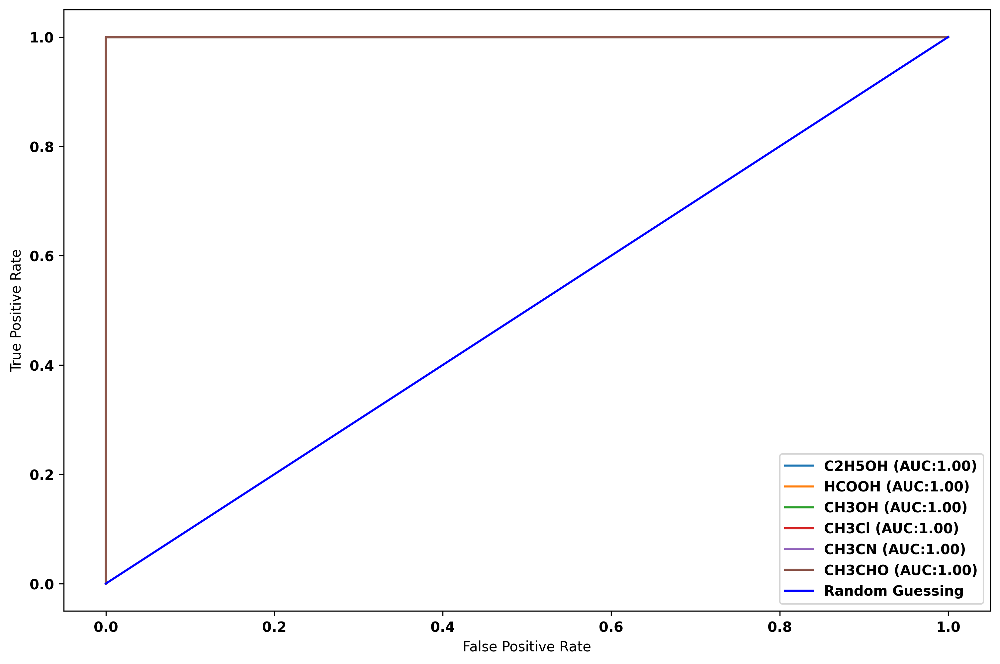

In [78]:

print('ROC AUC score:', multiclass_roc_auc_score(yexp, pred_y_exp, s.labels_exp)[0])

fig = multiclass_roc_auc_score(yexp, pred_y_exp, s.labels_exp)[1]
fig.savefig(r'RESULTS/results_figures/ROC_exp_data.png', bbox_inches='tight')
fig

### LIME/GRAD-CAM++

## PR Curve for test and exp_data

In [79]:
from sklearn.metrics import precision_recall_curve
from sklearn.metrics import average_precision_score
from sklearn.preprocessing import label_binarize

In [80]:
s.label_id

array([ 0,  1,  2,  3,  4,  5,  6,  7,  8,  9, 10, 11])

In [81]:
Y_test = label_binarize(y_test, classes=s.label_id)


In [82]:
Y_test_exp = label_binarize(yexp, classes=s.label_id)

In [83]:
Y_test_exp

array([[0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 1, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [0, 1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0, 0],
       [1,

In [84]:
from sklearn.metrics import PrecisionRecallDisplay
from itertools import cycle


def voc_net_pr_curve(n_classes,scores, Y_test, all_unique_labels):

    '''
    scores:raw score values from classifier
    Y_test: label binarized values
    
    '''

    n_classes =n_classes
    y_score = scores

    precision = dict()
    recall = dict()
    average_precision = dict()
    for i in range(n_classes):
        precision[i], recall[i], _ = precision_recall_curve(Y_test[:, i],
                                                            y_score[:, i])
        average_precision[i] = average_precision_score(Y_test[:, i], y_score[:, i])

    # A "micro-average": quantifying score on all classes jointly
    precision["micro"], recall["micro"], _ = precision_recall_curve(Y_test.ravel(),
        y_score.ravel())
    average_precision["micro"] = average_precision_score(Y_test, y_score,
                                                         average="micro")
    
    print('Average precision score, micro-averaged over all classes: {0:0.2f}'
          .format(average_precision["micro"]))
    
    
    # setup plot details
    colors = cycle(["red", "yellow", "green", "blue",
                    "olive", "navy", "turquoise", "darkorange", 
                    "cornflowerblue", "teal"])

    _, ax = plt.subplots(figsize=(8, 8),dpi=300)

    f_scores = np.linspace(0.2, 1, num=5)
    lines, labels = [], []
    for f_score in f_scores:
        x = np.linspace(0.01, 1)
        y = f_score * x / (2 * x - f_score)
        (l,) = plt.plot(x[y >= 0], y[y >= 0], color="gray", alpha=0.4)
        plt.annotate("f1={0:0.1f}".format(f_score), xy=(0.9, y[45] + 0.02))

    display = PrecisionRecallDisplay(
        recall=recall["micro"],
        precision=precision["micro"],
        average_precision=average_precision["micro"],
    )
    display.plot(ax=ax, name="Micro-average precision-recall", color="black")

    for i, color in zip(range(n_classes), colors):
        display = PrecisionRecallDisplay(
            recall=recall[i],
            precision=precision[i],
            average_precision=average_precision[i],
        )
        display.plot(ax=ax, name=f"Precision-recall for {all_unique_labels[i]}", color=color)

    # add the legend for the iso-f1 curves
    handles, labels = display.ax_.get_legend_handles_labels()
    handles.extend([l])
    labels.extend(["iso-f1 curves"])
    # set the legend and the axes
    ax.set_xlim([0.0, 1.0])
    ax.set_ylim([0.0, 1.05])
    ax.legend(handles=handles, labels=labels, loc="lower left", prop={'size': 6})
#     ax.set_title("Precision-Recall curve.")

    # plt.show()
    
    return _, precision, recall, average_precision

Average precision score, micro-averaged over all classes: 1.00


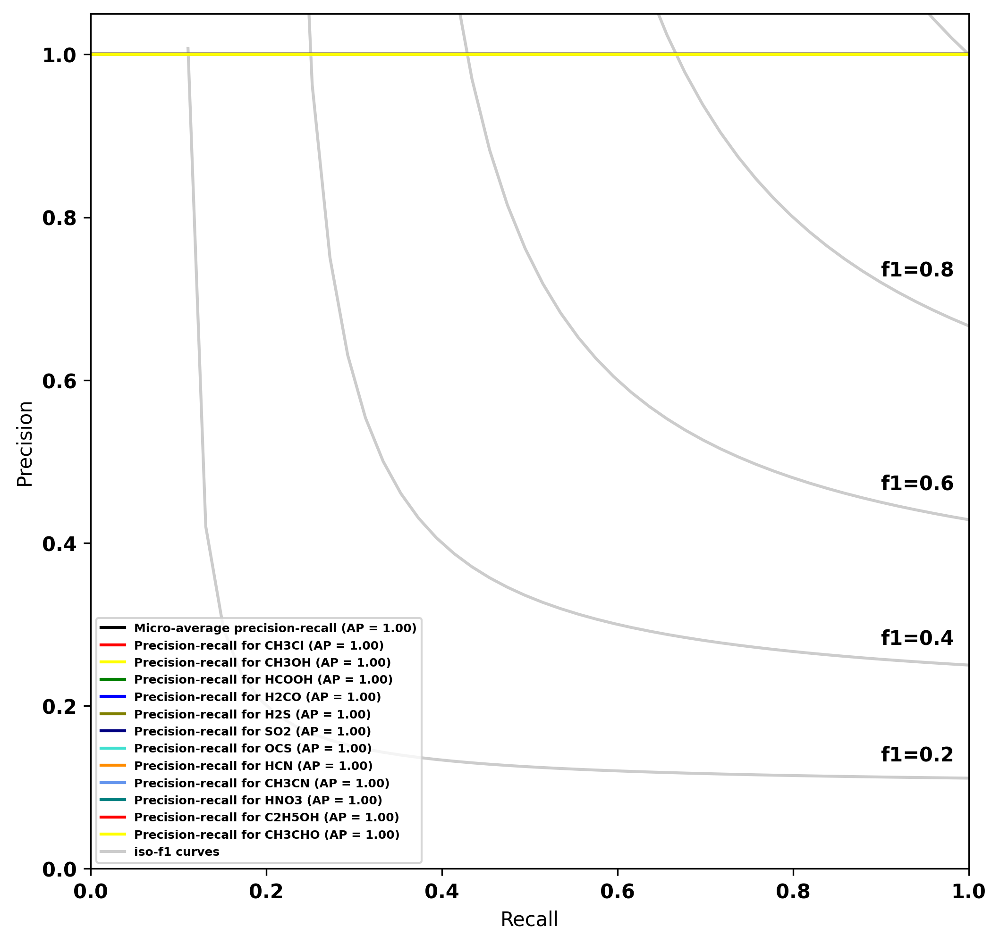

In [85]:
fig = voc_net_pr_curve(12 , predictions, Y_test, s.labels);
plt.savefig(r'RESULTS/results_figures/VOC_Net_pr_curve_test.png', bbox_inches='tight')

/home/reshad812/.local/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/home/reshad812/.local/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/home/reshad812/.local/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/home/reshad812/.local/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/home/reshad812/.local/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/home/reshad812/.local/lib/python3.8/site-packages/sklearn/metrics/_ranking.py:864: RuntimeWarning: invalid value encountered in true_divide
  recall = tps / tps[-1]
/hom

Average precision score, micro-averaged over all classes: 1.00


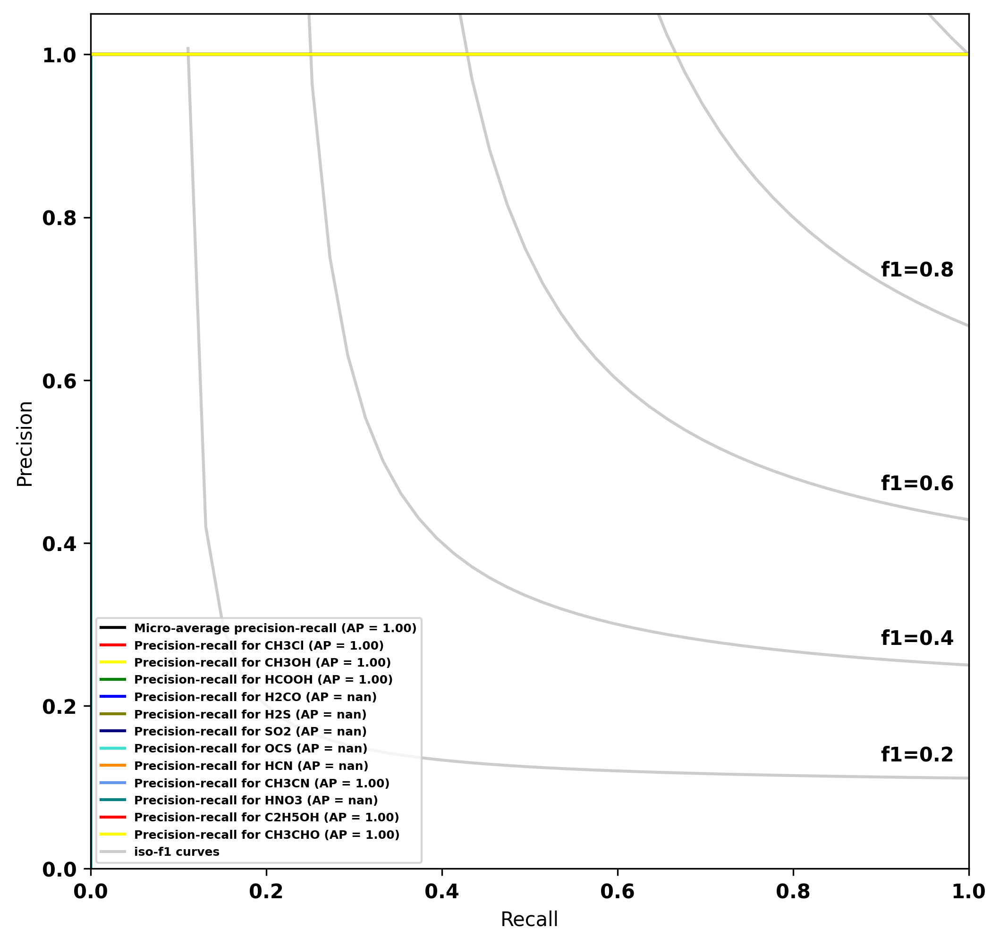

In [86]:
fig = voc_net_pr_curve(12 , predictions_exp, Y_test_exp, s.labels);
plt.savefig(r'RESULTS/results_figures/VOC_Net_pr_curve_exp.png', bbox_inches='tight')

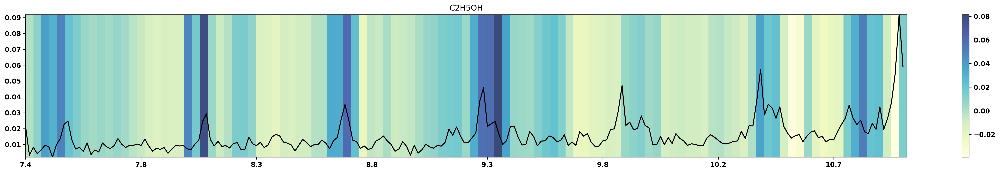

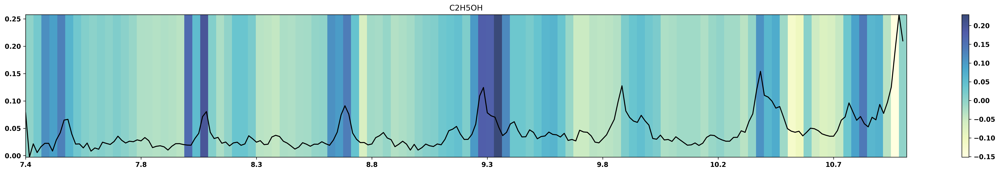

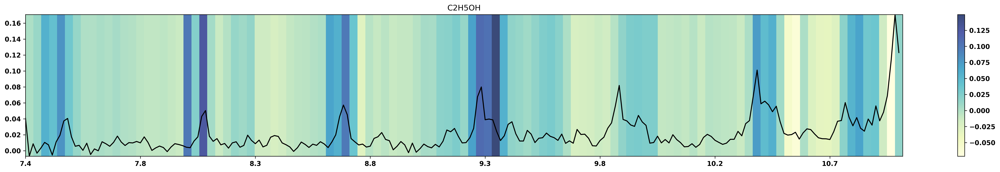

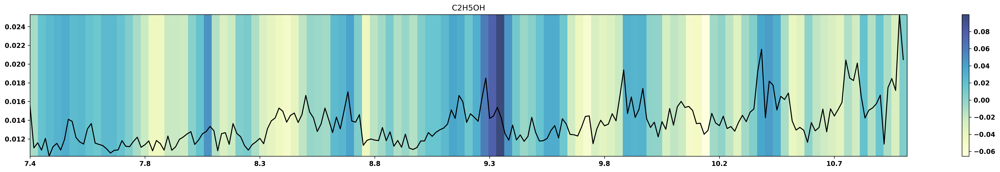

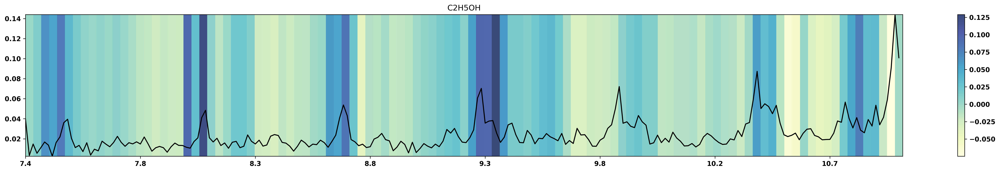

...

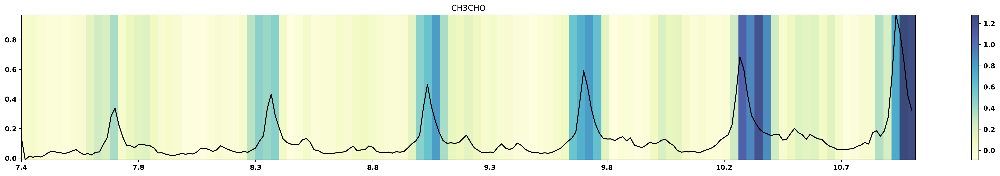

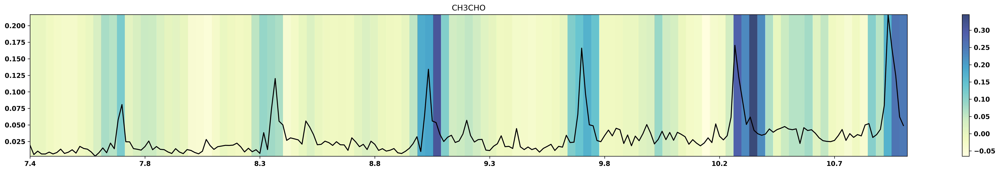

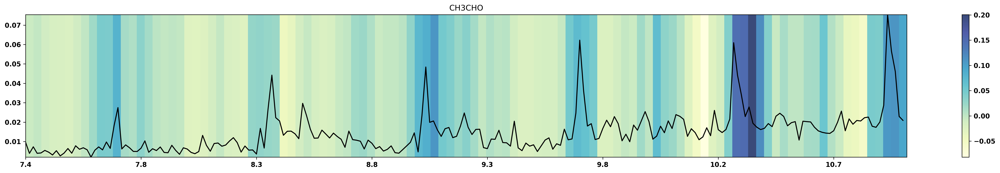

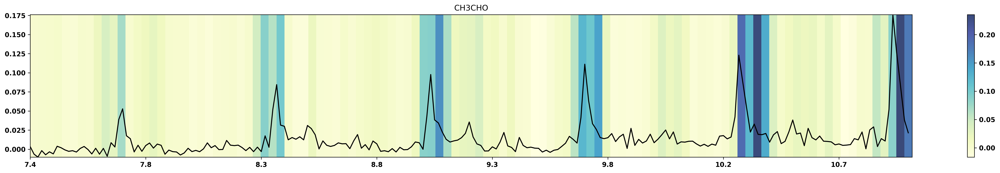

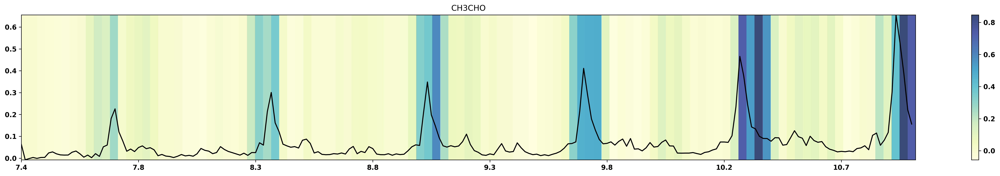

In [89]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt

def grad_cam(layer_name, data):
    grad_model = tf.keras.models.Model(
        [model.inputs], [model.get_layer(layer_name).output, model.output]
    )
    last_conv_layer_output, preds = grad_model(data)

    with tf.GradientTape() as tape:
        last_conv_layer_output, preds = grad_model(data)
        pred_index = tf.argmax(preds[0])
        class_channel = preds[:, pred_index]

    grads = tape.gradient(class_channel, last_conv_layer_output)

    pooled_grads = tf.reduce_mean(grads, axis=(0))

    last_conv_layer_output = last_conv_layer_output[0]

    heatmap = last_conv_layer_output * pooled_grads
    heatmap = tf.reduce_mean(heatmap, axis=(1))
    heatmap = np.expand_dims(heatmap,0)
    return heatmap

layer_name = "C3"
count = 0
for i,j in zip(Xexp,yexp):
    
    data = np.expand_dims(i,0)
    heatmap = grad_cam(layer_name,data)

    fig = plt.figure(figsize=(30,4),dpi=300)
    plt.imshow(np.expand_dims(heatmap,axis=2),cmap='YlGnBu', aspect="auto", interpolation='nearest',extent=[0,229,i.min(),i.max()], alpha=0.8)
    
    ticklist = range(0,229)
    plt.xticks(ticklist[::30], np.round(s.frequencies.tolist()[::30], decimals=1) ) # tick every 40th frequency
    plt.plot(i,'k')
    plt.title(f'{s.labels[j]}')
    plt.colorbar()
    plt.clim(np.min(heatmap),np.max(heatmap))
    
    plt.show()
    
    fig.savefig(r'RESULTS/class_activation_maps/CAM_exp' + str(count) + '.png', bbox_inches='tight')
    count = count + 1